In [24]:
import os
import chardet
import pandas as pd
import numpy as np
import json
import glob
import pickle

In [25]:
# instantiating lists for separating grids by day
grids = []
mon_list = []
tue_list = []
wed_list = []
thu_list = []
fri_list = []
sat_list = []
sun_list = []

# creating dict to sort the puzzles by day of the week (dow)
dow_dict={
    "monday":mon_list,
    "tuesday":tue_list,
    "wednesday":wed_list,
    "thursday":thu_list,
    "friday":fri_list,
    "saturday":sat_list,
    "sunday":sun_list
}

# iterating through the directory tree of all the puzzles (this was how the data was stored in the database, unfortunately)
for fpath in glob.glob(pathname="../data/json/shortz/*/*/*.json",recursive=True):
    with open(fpath,'r') as cw:
        try:
            cw_json = json.JSONDecoder().decode(cw.readline())
            dow = cw_json['dow'].lower()
            dow_dict[dow] = dow_dict[dow] + [cw_json['grid']]

            # grids = grids + [cw_json['grid']] # get all grids
        except(json.JSONDecodeError):
            print('uh oh')

pickle.dump(obj=dow_dict,file=(open('../bin/pickles/dow_dict.pickle','wb')))



for fpath in glob.glob(pathname="../data/json/shortz/*/*/*.json",recursive=True):
    with open(fpath,'r') as cw:
        try:
            cw_json = json.JSONDecoder().decode(cw.readline())
            grids = grids + [cw_json['grid']] # get all grids
        except(json.JSONDecodeError):
            print('uh oh')

raw_grids = grids.copy()


uh oh
uh oh
uh oh
uh oh


In [4]:
# CONSTANTS FOR THE SIZE OF STANDARD SIZE GRIDS (15X15) AS WELL AS THE LARGER SUNDAY GRIDS (21X21)
GRID_DIM = 15
SUNDAY_GRID_DIM = 21

GRID_SHAPE = (GRID_DIM,GRID_DIM)
SUNDAY_GRID_SHAPE = (SUNDAY_GRID_DIM,SUNDAY_GRID_DIM)




In [5]:
#  if a square is empty, 0.  If a square is black, 1.
def bin_gridify(raw_grids):
    binary_grids = []
    for grid in raw_grids:
        new_grid = [1 if x == "." else 0 for x in grid ]
        binary_grids = binary_grids + [new_grid]
    return binary_grids
grids = bin_gridify(raw_grids)

In [6]:
# converting 1d grids to n x n numpy arrays
sunday_grids = [np.array(grid).reshape(SUNDAY_GRID_SHAPE) for grid in grids if len(grid) == SUNDAY_GRID_DIM * SUNDAY_GRID_DIM]
normal_grids = [np.array(grid).reshape(GRID_SHAPE) for grid in grids if len(grid) == GRID_DIM * GRID_DIM]


In [7]:
# summing and normalizing all arrays to generate heatmaps
from sklearn.preprocessing import normalize

normal_grids_sum = np.sum(normal_grids, axis=0)
sunday_grids_sum = np.sum(sunday_grids, axis=0)
normal_grids_sum = normalize(normal_grids_sum)
sunday_grids_sum = normalize(sunday_grids_sum)

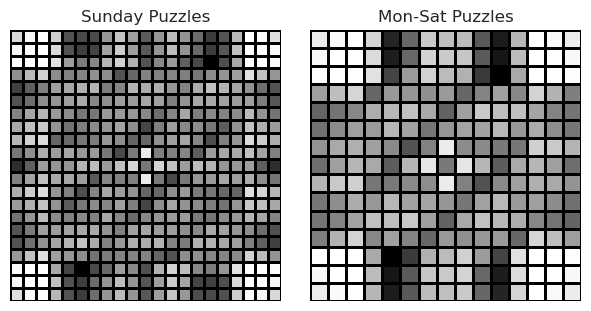

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()




fig, (ax1, ax2) = plt.subplots(1,2,figsize=(6,3),squeeze=True);
fig.set_constrained_layout(True)
sns.heatmap(normal_grids_sum, ax=ax2,cmap="binary",cbar=False,linewidths=2,linecolor="Black",square=True,xticklabels=False,yticklabels=False);
ax2.set_title("Mon-Sat Puzzles")
ax1.set_title("Sunday Puzzles")
sns.heatmap(sunday_grids_sum, ax=ax1,cmap="binary",cbar=False,linewidths=2,linecolor="Black",square=True,xticklabels=False,yticklabels=False);

In [9]:
import plotly.express as px
from plotly.subplots import make_subplots
fig = make_subplots(1,2)
# px.imshow(normal_grids_sum,c)

In [11]:
across_df = pd.DataFrame([cw_json['clues']['across'],cw_json['answers']['across']])

grid_list_lengths = len(dow_dict['monday']), len(dow_dict['tuesday']),len(dow_dict['wednesday']), len(dow_dict['thursday']), len(dow_dict['friday']), len(dow_dict['saturday']), len(dow_dict['sunday'])
print(grid_list_lengths)
grid_list_lengths = pd.DataFrame(grid_list_lengths,index=dow_dict.keys(),columns=["Number of Puzzles"])
print(grid_list_lengths.T)
fig.add_bar(y=grid_list_lengths['Number of Puzzles'],x=list(grid_list_lengths.index))
# fig.add_bar(x=grid_list_lengths['Number of Puzzles'],y=list(grid_list_lengths.index))

(1168, 1163, 1164, 1150, 1151, 1155, 1154)
                   monday  tuesday  wednesday  thursday  friday  saturday  \
Number of Puzzles    1168     1163       1164      1150    1151      1155   

                   sunday  
Number of Puzzles    1154  


In [12]:
dow_dict.values()

dict_values([[['S', 'T', 'O', 'M', 'P', '.', 'L', 'I', 'M', 'P', '.', 'S', 'A', 'N', 'S', 'P', 'A', 'L', 'E', 'O', '.', 'U', 'V', 'E', 'A', '.', 'U', 'H', 'O', 'H', 'O', 'C', 'E', 'A', 'N', '.', 'L', 'A', 'M', 'S', '.', 'R', 'O', 'P', 'E', 'I', 'K', 'I', 'D', 'Y', 'O', 'U', 'N', 'O', 'T', '.', 'E', 'Y', 'E', 'D', 'L', 'Y', 'C', 'E', 'U', 'M', '.', '.', 'R', 'A', 'P', 'T', '.', '.', '.', '.', '.', '.', '.', 'P', 'E', 'R', 'K', 'Y', '.', 'A', 'H', 'O', 'L', 'D', 'L', 'I', 'L', 'Y', '.', 'R', 'A', 'N', '.', 'F', 'R', 'I', 'D', 'A', 'Y', 'E', 'R', 'O', 'O', '.', 'T', 'H', 'E', 'D', 'A', '.', 'N', 'O', 'D', 'E', 'N', 'E', 'B', 'U', 'L', 'A', '.', 'L', 'I', 'L', '.', 'G', 'R', 'A', 'D', 'A', 'D', 'O', 'B', 'E', '.', 'A', 'T', 'A', 'L', 'E', '.', '.', '.', '.', '.', '.', '.', 'E', 'A', 'S', 'T', '.', '.', 'A', 'R', 'A', 'B', 'I', 'C', 'F', 'A', 'S', 'T', '.', 'A', 'B', 'S', 'O', 'L', 'U', 'T', 'E', 'L', 'Y', 'E', 'X', 'E', 'C', '.', 'T', 'A', 'T', 'A', '.', 'P', 'A', 'N', 'I', 'C', 'T', 'E', 

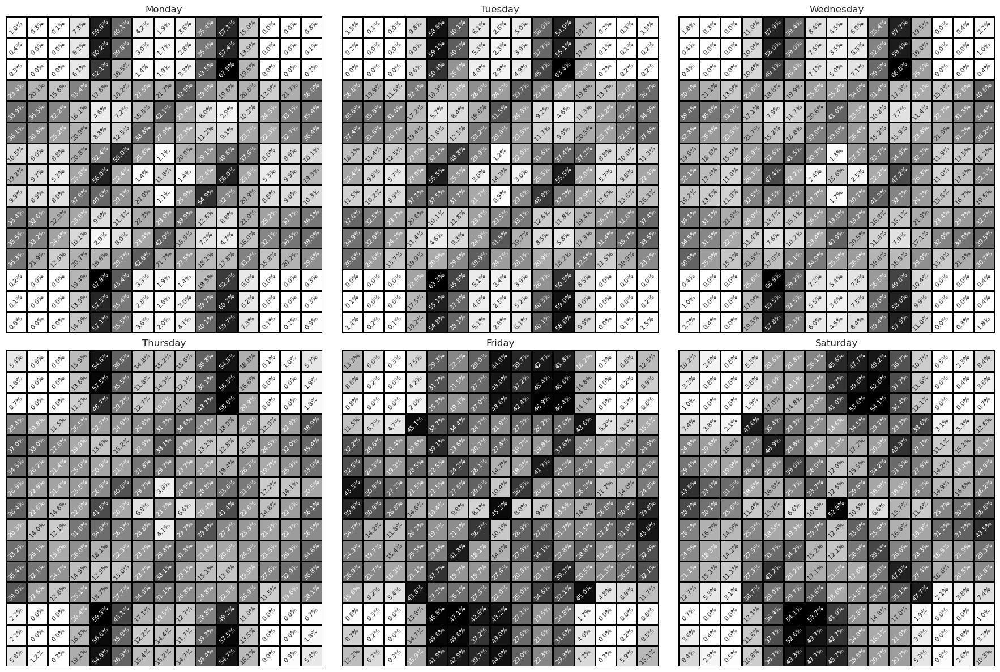

In [13]:

fig, ax_list = plt.subplots(2,3,figsize=(18,12));
plt.title("Heat map of black squares for each day of the week.",loc='center')

dow_plot_dict = {}
# _, ax_list = plt.subplots(3,2);
i = 0
tvmax = 0.6

import matplotlib

for day in dow_dict.keys():
    grid_list = dow_dict[day]
    grid_list = bin_gridify(grid_list)
    if day != "sunday":
        day_grid = [np.array(grid).reshape(GRID_SHAPE) for grid in grid_list if len(grid) == GRID_DIM * GRID_DIM]
        normalized_grid_sum = normalize(np.sum(day_grid,axis=0))
        idx_tup = (i //3, i%3)
        tvmax = max(normalized_grid_sum.max(),tvmax)
        sns.heatmap(normalized_grid_sum,ax=ax_list[idx_tup],square=True,linewidths=2,linecolor='black',cmap='binary',cbar=False,cbar_kws={'location':'left', "aspect":30,"shrink":0.6,"pad":0.02},xticklabels=[None]*GRID_DIM,yticklabels=[None]*GRID_DIM,annot=True,fmt=".1%",annot_kws={"size":8,"rotation":45});
        dow_plot_dict[day] = normalized_grid_sum
        i+=1
        ax_list[idx_tup].set_title(day.capitalize())
        # plt.colorbar(ax=ax_list[idx_tup])
    else:
        day_grid = [np.array(grid).reshape(SUNDAY_GRID_SHAPE) for grid in grid_list if len(grid) == SUNDAY_GRID_DIM * SUNDAY_GRID_DIM]
        dow_plot_dict[day] = sunday_grids_sum

fig.set_tight_layout(True)

plt.show()

In [14]:
from jupyter_dash import JupyterDash
import dash
from dash import  dcc, html
from dash.dependencies import Input,Output
import dash_daq as daq
from plotly.subplots import make_subplots
import plotly.express as px


app = JupyterDash(__name__)
# figure = plotly.add_heatmap(colorscale='greys',x=list(range(1,22)),y=list(range(1,22)),dx=1,dy=1,z=sunday_grids_sum)
# figure = px.imshow(sunday_grids_sum,aspect=1)
# figure.add_heatmap(sunday_grids_sum,title="")
px.imshow(sunday_grids_sum,aspect='square',text_auto=False,width=1000)
app.layout = html.Div([
    html.H1("Heatmap of Black Boxes in Puzzles, grouped by Day of Week"),
    dcc.Graph(id='graph'),
    html.Label([
        "Day of the Week:",
        dcc.Dropdown(
            id='dow-dd', clearable=False,
            value='sunday', options=[
                {'label': c, 'value': c}
                for c in dow_plot_dict.keys()
            ]),
        "Show Labels",
        daq.BooleanSwitch(
            id="labels-toggle",
            label="Show percentage labels?",
            on=False
        )
    ]),
])
# Define callback to update graph
@app.callback(
    Output('graph', 'figure'),
    Input("dow-dd", "value"),
    Input("labels-toggle","on")

)
def update_figure(value,on):
    grid = dow_plot_dict[value]
    fig = px.imshow(grid,aspect='equal',text_auto=on,title=f"{day.capitalize()} heatmap",color_continuous_scale=["white", "black"],width=1000)

    return fig
app.run_server(mode="external",debug="true",width=1000)
server = app.server

Dash app running on http://127.0.0.1:8050/


In [15]:
sunday_grids_sum

array([[0.07592997, 0.01604154, 0.00320831, 0.09517982, 0.33045577,
        0.34863618, 0.34435844, 0.201054  , 0.11336023, 0.18394302,
        0.31334479, 0.20319287, 0.13154065, 0.20533174, 0.28340058,
        0.37323322, 0.32724746, 0.13795726, 0.00106944, 0.00855549,
        0.06095786],
       [0.01628689, 0.00271448, 0.        , 0.073291  , 0.32845225,
        0.36781223, 0.35966879, 0.17915577, 0.10043581, 0.18729922,
        0.31759433, 0.20494335, 0.12893787, 0.20765783, 0.28637779,
        0.3732412 , 0.32438053, 0.1235089 , 0.        , 0.        ,
        0.01221517],
       [0.00533981, 0.        , 0.00266991, 0.05606802, 0.1868934 ,
        0.25097114, 0.2322818 , 0.141505  , 0.0907768 , 0.15218463,
        0.32839841, 0.22961189, 0.18956331, 0.30436925, 0.34975765,
        0.48859275, 0.33907803, 0.16820406, 0.        , 0.        ,
        0.00800972],
       [0.21347754, 0.1356349 , 0.08963698, 0.22055414, 0.24060452,
        0.23470735, 0.2122981 , 0.21583641, 0.3302415

In [19]:
# csv = pd.read_table("../data/clue-doc/clues", encoding='iso8859_1', compression='bz2',sep='\t',lineterminator='\n',error_bad_lines=False,names=['answer',''])
csv = pd.read_table("../data/clue-doc/clues", encoding='iso8859_1',sep='\t',lineterminator='\n',error_bad_lines=False,names=['answer',''])

/tmp/ipykernel_16366/3383464436.py:2: FutureWarning:

The error_bad_lines argument has been deprecated and will be removed in a future version. Use on_bad_lines in the future.



b'Skipping line 4781380: expected 2 fields, saw 12\n'
/tmp/ipykernel_16366/3383464436.py:2: DtypeWarning:

Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.



In [20]:
import bz2
import pandas as pd
import chardet

with bz2.open('../data/clues.bz2',mode="rb",) as f:
    print(pd.reaf.readline())

AttributeError: module 'pandas' has no attribute 'reaf'

In [21]:
pd.

SyntaxError: invalid syntax (1883224570.py, line 1)

In [22]:
f = pd.read_csv('../data/clues.bz2',compression='bz2',delim_whitespace=True)

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xe1 in position 84797: invalid continuation byte

In [ ]:
# instantiating lists for different kinds of clues


In [ ]:
csv.

In [18]:
pd.read_table('../data/clue-doc/clues')

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xe1 in position 84797: invalid continuation byte